<a href="https://colab.research.google.com/github/Murcha1990/ML_AI24/blob/main/Hometasks/Base/AI_HW1_Regression_with_inference_base.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (base)**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
* реализовать веб-сервис для применения построенной модели на новых данных

**Максимальная оценка за дз**
> Оценка за домашку = $min(\text{ваш балл}, 11)$

**Мягкий дедлайн: 27 ноября 23:59**

**Жесткий дедлайн: 20 декабря 23:59 (конец модуля)**


**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [321]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns

random.seed(42)
np.random.seed(42)

**Задание 0 (0 баллов).**
Для чего фиксируем сиды в домашках?

Чтобы выборки каждый раз были те же и проверяющий видел то же что и мы

# **Часть 1 | EDA и визуализация**

Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (2.5 балла)
- Визуализации признаков и их анализ (1 балл)

Всего можно набрать 3.5 основных балла и 0.65 бонусных. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (2.5 балла)**

In [322]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1 (0.55 балла)**

Выполните операции, направленные на практику основных действий с `pandas`:
- [ ] Отобразите 10 случайных строк тренировочного датасета (0.15 балла)
- [ ] Отобразите первые 5 и последние 5 объектов тестового датасета (0.1 балла)
- [ ] Посмотрите, есть ли в датасете пропуски. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)


**Бонус**
- [ ] Постройте дашборд, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)

In [323]:
df_train.sample(10)

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
6565,Renault KWID Climber 1.0 MT BSIV,2019,300000,35000,Petrol,Individual,Manual,First Owner,23.01 kmpl,999 CC,67 bhp,91Nm@ 4250rpm,5.0
2943,Maruti Wagon R LXI,2013,225000,58343,Petrol,Trustmark Dealer,Manual,First Owner,21.79 kmpl,998 CC,67.05 bhp,90Nm@ 3500rpm,5.0
2024,Hyundai i20 Asta 1.2,2013,360000,30000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
263,Hyundai i20 1.2 Asta,2010,300000,70000,Petrol,Individual,Manual,First Owner,17.0 kmpl,1197 CC,80 bhp,"11.4 kgm at 4,000 rpm",5.0
4586,Skoda Octavia L and K 1.9 TDI MT,2005,250000,120000,Diesel,Individual,Manual,Third Owner,16.4 kmpl,1896 CC,90 bhp,"21.4@ 1,900(kgm@ rpm)",5.0
4479,Maruti Ciaz ZXi,2016,700000,20000,Petrol,Individual,Manual,First Owner,20.73 kmpl,1373 CC,91.1 bhp,130Nm@ 4000rpm,5.0
4881,Hyundai Grand i10 1.2 Kappa Magna BSIV,2017,445000,27000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
3583,Ford Ecosport 1.5 DV5 MT Trend,2016,515000,68609,Diesel,Dealer,Manual,First Owner,22.7 kmpl,1498 CC,89.84 bhp,204Nm@ 2000-2750rpm,5.0
6361,Hyundai Verna 1.4 VTVT,2014,500000,33400,Petrol,Individual,Manual,First Owner,17.43 kmpl,1396 CC,105.5 bhp,135.3Nm@ 5000rpm,5.0
4108,Hyundai i20 Era 1.2,2015,490000,45900,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0


In [324]:
df_test.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0


In [325]:
df_test.tail()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81 kmpl,1086 CC,68.05 bhp,99.04Nm@ 4500rpm,5.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,81.83 bhp,114.7Nm@ 4000rpm,5.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36 kmpl,1197 CC,78.9 bhp,111.8Nm@ 4000rpm,5.0
999,Honda City i DTec SV,2016,700000,110000,Diesel,Individual,Manual,First Owner,26.0 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0


In [326]:
df_train.isnull().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,202
engine,202


In [327]:

df_train.columns[df_train.isnull().any()]

Index(['mileage', 'engine', 'max_power', 'torque', 'seats'], dtype='object')

In [328]:
print('Явные дубликаты:', df_train.duplicated().sum())

Явные дубликаты: 985


Дашборд

In [329]:
pip install ydata-profiling

In [330]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df_train, title="Profiling Report")
profile.to_widgets()

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:528: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

Мы обнаружили пропуски. Давайте избавимся от них.

- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось. Заполнение пропусков проводите для обоих наборов данных, если необходимо

**Важно!**

При заполнении пропусков и в тестовом, и тренировочном наборах данных вы определяетесь со стратегией предобработки пропущенных значений при потенциальной работе модели.

Так как в теоретическом случае вы не имеете доступа к тестовой выборке, то заполняемой значение (у нас — медиана) вы считаете про *тренировочному* набору данных и им же заполняете *тестовый*.

In [331]:
# выполняю под заданием 3 после основной обработки данных

### **Задание 2 (0.5 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.1 балла)
- [ ] Отобразите такие объекты (0.15 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.15 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.1 балла)


In [332]:
dupl = (df_train.drop('selling_price', axis=1).duplicated(keep=False))
dupl.sum()

1799

In [333]:

df_train[dupl].sort_values(by=df_train.columns.drop('selling_price').tolist())

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
1703,Audi Q3 2.0 TDI Quattro Premium Plus,2017,2825000,22000,Diesel,Dealer,Automatic,First Owner,15.73 kmpl,1968 CC,174.33 bhp,380Nm@ 1750-2500rpm,5.0
6307,Audi Q3 2.0 TDI Quattro Premium Plus,2017,2825000,22000,Diesel,Dealer,Automatic,First Owner,15.73 kmpl,1968 CC,174.33 bhp,380Nm@ 1750-2500rpm,5.0
1836,Audi Q5 3.0 TDI Quattro,2014,1850000,76131,Diesel,Individual,Automatic,First Owner,13.22 kmpl,2967 CC,241.4 bhp,580Nm@ 1400-3250rpm,5.0
6704,Audi Q5 3.0 TDI Quattro,2014,1850000,76131,Diesel,Individual,Automatic,First Owner,13.22 kmpl,2967 CC,241.4 bhp,580Nm@ 1400-3250rpm,5.0
117,Audi Q5 35TDI Premium Plus,2018,3975000,31800,Diesel,Dealer,Automatic,First Owner,17.01 kmpl,1968 CC,188 bhp,400nm@ 1750-3000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5637,Volvo XC40 D4 Inscription BSIV,2019,3800000,20000,Diesel,Individual,Automatic,First Owner,18.0 kmpl,1969 CC,190 bhp,400Nm,5.0
5652,Volvo XC40 D4 Inscription BSIV,2019,3800000,20000,Diesel,Individual,Automatic,First Owner,18.0 kmpl,1969 CC,190 bhp,400Nm,5.0
5753,Volvo XC40 D4 Inscription BSIV,2019,3800000,20000,Diesel,Individual,Automatic,First Owner,18.0 kmpl,1969 CC,190 bhp,400Nm,5.0
5991,Volvo XC40 D4 Inscription BSIV,2019,3800000,20000,Diesel,Individual,Automatic,First Owner,18.0 kmpl,1969 CC,190 bhp,400Nm,5.0


In [334]:
df_train = df_train.drop_duplicates(subset=df_train.columns.drop('selling_price').tolist(), keep='first')

In [335]:
#обновляем индексы
df_train = df_train.reset_index(drop=True)

In [336]:
df_test.shape

(1000, 13)

In [337]:
assert df_train.shape == (5840, 13)

Отлично! Мы избавились от маленьких и явных проблем. Теперь перейдем к более сложным недостаткам полученной таблицы.

### **Задание 3 (0.25 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Удалите столбец ``torque``


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.
- Стобец ``torque`` мы удаляем для простоты. В идеальном случае, его также стоило бы предобработать.

In [338]:
#Удаляем колонку 'torque' в треин и тест
df_test = df_test.drop('torque', axis=1)
df_train = df_train.drop('torque', axis=1)

In [339]:
import re

In [340]:
def to_decimal(x):
  try:
    return float(''.join(re.findall(r'-?\d*\.?\d*', x)))
  except:
    return None

In [341]:
df_train['mileage2'] = df_train['mileage'].apply(to_decimal)
df_train['mileage_measure'] = df_train['mileage'].astype(str).apply(lambda x: ''.join(re.findall(r'[a-zA-Z]+', x)))
#test
df_test['mileage2'] = df_test['mileage'].apply(to_decimal)
df_test['mileage_measure'] = df_test['mileage'].astype(str).apply(lambda x: ''.join(re.findall(r'[a-zA-Z]+', x)))

In [342]:
df_train['mileage_measure'].value_counts()

,count
mileage_measure,
kmpl,5577
nan,186
kmkg,77


переведем км/кг в км/л

In [343]:
df_train.loc[df_train['mileage_measure'] == 'kmkg', 'mileage2'] *= 1.4
df_test.loc[df_test['mileage_measure'] == 'kmkg', 'mileage2'] *= 1.4

In [344]:
df_test.shape

(1000, 14)

Удаляем лишние столбики

In [345]:
df_train['mileage'] = df_train['mileage2']
df_train = df_train.drop(['mileage2', 'mileage_measure'], axis=1)
df_test['mileage'] = df_test['mileage2']
df_test = df_test.drop(['mileage2', 'mileage_measure'], axis=1)

Переводим другие стобцы в float

In [346]:
df_train['engine'] = df_train['engine'].apply(to_decimal)
df_test['engine'] = df_test['engine'].apply(to_decimal)


In [347]:
df_train['max_power'] = df_train['max_power'].apply(to_decimal)
df_test['max_power'] = df_test['max_power'].apply(to_decimal)


In [348]:
df_train.shape

(5840, 12)

In [349]:
df_test.shape

(1000, 12)

**Удаляем прропуски**

In [350]:
median_mileage = df_train['mileage'].median()
median_engine = df_train['engine'].median()
median_max_power = df_train['max_power'].median()
median_seats = df_train['seats'].median()
value_null = {'mileage' : median_mileage, 'engine' : median_engine, 'max_power' : median_max_power, 'seats' : median_seats}

In [351]:
df_train = df_train.fillna(value=value_null)

In [352]:
df_train.isnull().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,0
engine,0


In [353]:
df_test = df_test.fillna(value=value_null)

In [354]:
df_test.isnull().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,0
engine,0


### **Задание 4 (0.1 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.

In [355]:
df_train['engine'] = df_train['engine'].astype(int)
df_train['seats'] = df_train['seats'].astype(int)
df_test['engine'] = df_test['engine'].astype(int)
df_test['seats'] = df_test['seats'].astype(int)

### **Задание 5 (0.1 балла)**

Отлично! Мы провели "косметическую" предобработку и теперь готовы сделать важный шаг в контексте анализа данных. А именно — посмотреть на статистики!

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

**Примечание:**

Более корректно рассматривать статистики до заполнения пропусков и после, чтобы убедиться, что мы не внесли каких-либо серьезных сдвигов в изначальные рапсределения.

In [356]:
df_train.describe()

,year,selling_price,km_driven,mileage,engine,max_power,seats
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.547135,1429.448973,87.906371,5.426712
std,4.095622,5.354320e+05,6.007114e+04,4.228290,485.662834,31.640418,0.982344
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,2.000000
25%,2011.000000,2.500000e+05,3.900000e+04,17.000000,1197.000000,68.000000,5.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.400000,1248.000000,81.860000,5.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.320000,1498.000000,99.000000,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,46.816000,3604.000000,400.000000,14.000000


In [357]:
df_test.describe()

,year,selling_price,km_driven,mileage,engine,max_power,seats
count,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000
mean,2013.681000,6.179010e+05,71393.341000,19.414176,1454.87600,90.841670,5.403000
std,4.012149,7.585539e+05,48486.218662,4.090353,521.99574,34.893389,0.912921
min,1995.000000,3.100000e+04,1303.000000,0.000000,624.00000,34.200000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,16.587500,1197.00000,69.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,19.400000,1248.00000,82.425000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,22.320000,1582.00000,102.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,45.164000,3604.00000,280.000000,9.000000


In [358]:
df_train.describe(include='object')

,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,1924,4,3,2,5
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner
freq,91,3177,5223,5336,3603


In [359]:
df_test.describe(include='object')

,name,fuel,seller_type,transmission,owner
count,1000,1000,1000,1000,1000
unique,621,4,3,2,5
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner
freq,15,534,837,877,623


In [360]:
assert df_train.shape == (5840, 12)

## **Визуализации (1 балл + 0.5 бонус)**



Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 6 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

In [361]:
import seaborn as sns

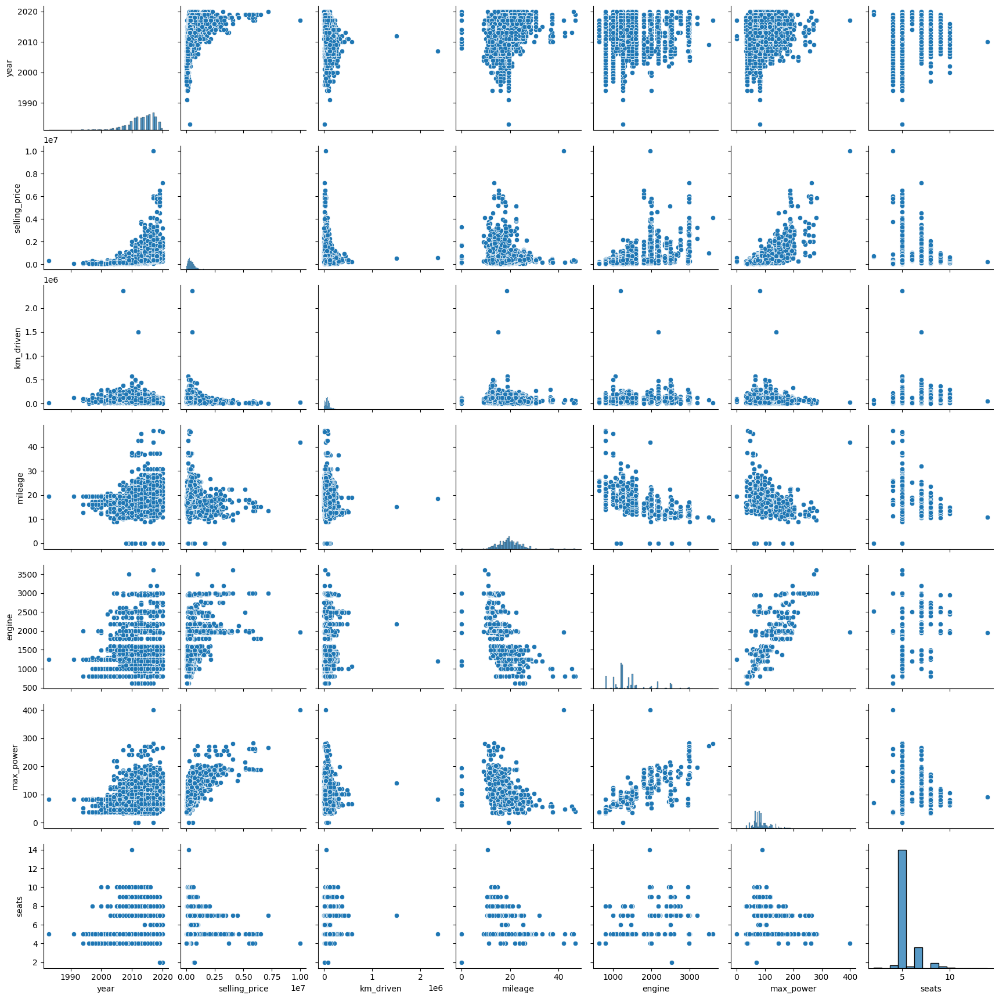

In [362]:
sns.pairplot(df_train)


По данным графикам заметна некоторая связь целевой переменной с макс мощностью и годом машины, про остальное сложно сказать. Можно выдвинуть гипотезу о связи двигателя и макс мощности.


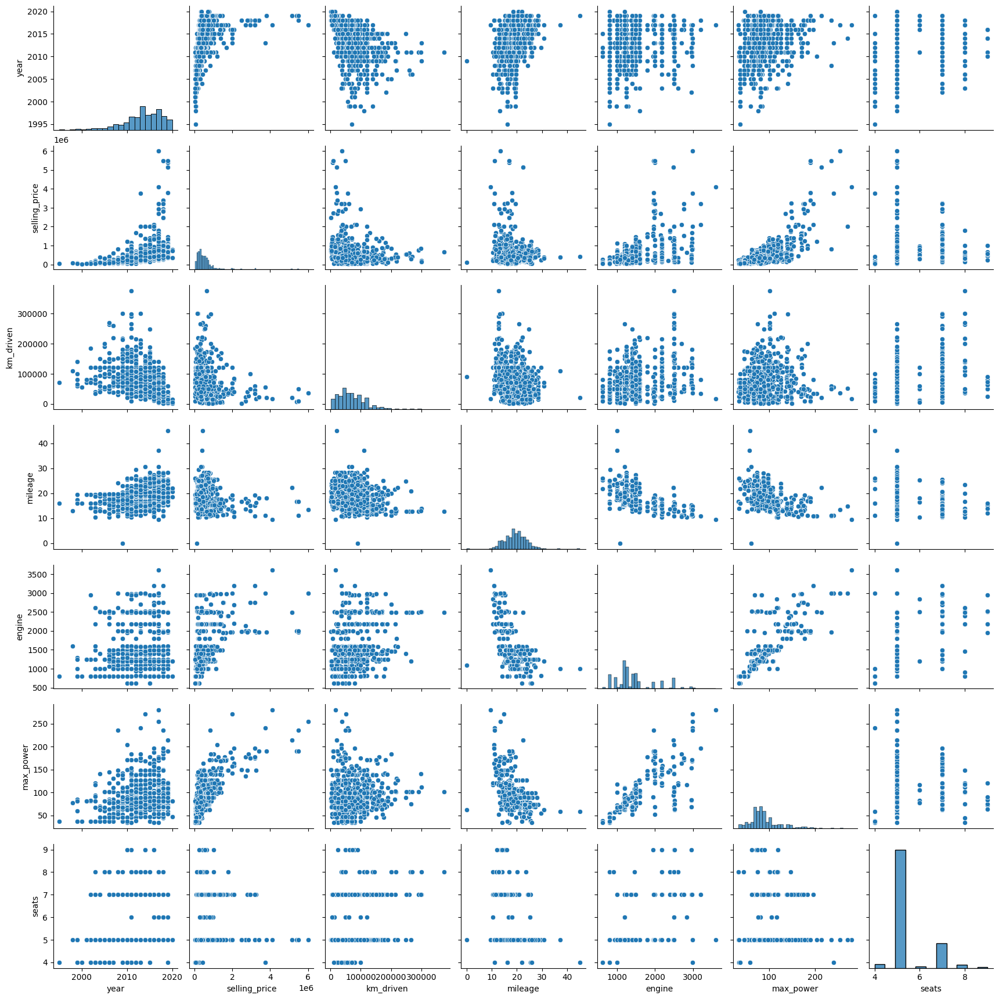

In [363]:
sns.pairplot(df_test)

Распределения трейна и теста похожи

### **Задание 7 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)


<Axes: >

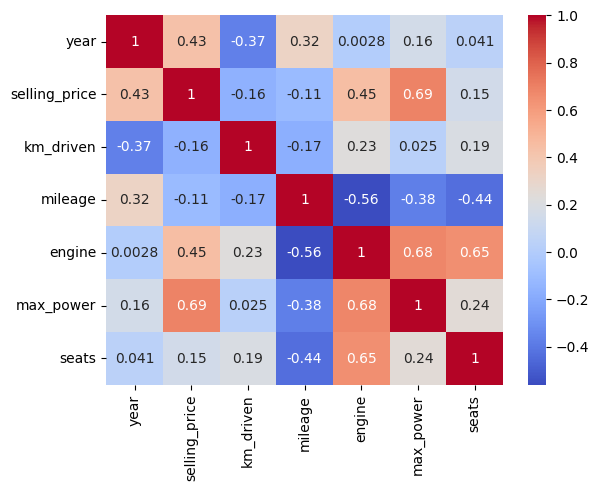

In [364]:
sns.heatmap(df_train.corr(numeric_only=True), annot=True, cmap='coolwarm')

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?



*   Наименее скоррелированы year и engine
*   Цена и макс. мощность, двигатель и макс. мощность, цена и год, двигатель и сидения.
*  Да, верно, чем меньше год, тем старше машина и больше ее пробег



### **Бонус (0.5 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их **и поясните.**

<Axes: xlabel='selling_price', ylabel='Count'>

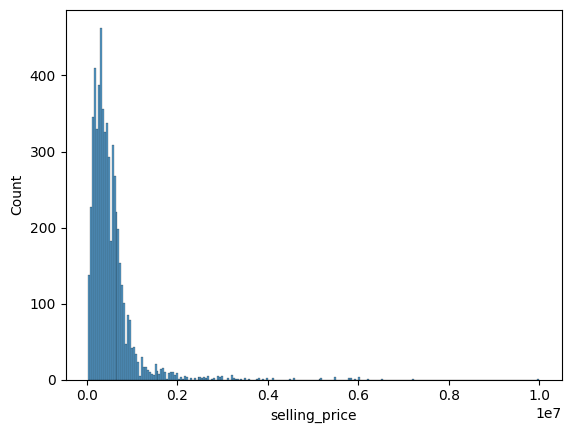

In [365]:
sns.histplot(df_train['selling_price'])

посмотрим на распределение целевой переменной. видим длинный хвост, что говорит о выбросах. Распределение с обрывос слева

<Axes: ylabel='selling_price'>

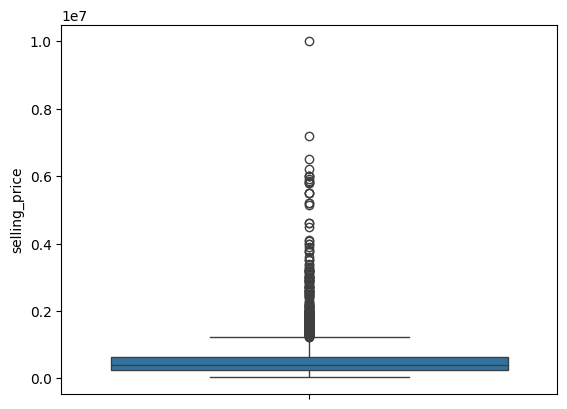

In [366]:
sns.boxplot(df_train['selling_price'])

по ящику с усами видно, что много выбросов или машин премиального сегмента.  большинство машин стоимостью до 2 миллионов

# **Часть 2 | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.25 балла;

### **Задание 8 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [367]:
numeric_columns = ['year', 'km_driven', 'mileage', 'engine', 'max_power', 'seats', 'selling_price']
df_train_num = df_train[numeric_columns].copy()
df_test_num = df_test[numeric_columns].copy()

In [368]:
y_train = df_train_num['selling_price']
X_train = df_train_num.drop('selling_price', axis=1)

In [369]:
assert X_train.shape == (5840, 6)

In [370]:
y_test = df_test_num['selling_price']
X_test = df_test_num.drop('selling_price', axis=1)

In [371]:
assert X_test.shape == (1000, 6)

### **Задание 9 (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [372]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

lr1 = LinearRegression()
lr1.fit(X_train, y_train)

LinearRegression()

In [373]:
pred_train = lr1.predict(X_train)
pred_test = lr1.predict(X_test)

print('R2 для трейна', r2_score(y_train, pred_train))
print('R2 для теста', r2_score(y_test, pred_test))
print('MSE для трейна', MSE(y_train, pred_train))
print('MSE для теста', MSE(y_test, pred_test))
print('RMSE для трейна', np.sqrt(MSE(y_train, pred_train)))
print('RMSE для теста', np.sqrt(MSE(y_test, pred_test)))

R2 для трейна 0.5923541622424288
R2 для теста 0.5943987740330974
MSE для трейна 116846925573.33882
MSE для теста 233151166887.73697
RMSE для трейна 341828.79570530454
RMSE для теста 482857.294537151


### **Задание 10 (0.15 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [374]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train)
train_x_scaler = scaler.transform(X_train)
test_x_scaler = scaler.transform(X_test)


lr2 = LinearRegression()
lr2.fit(train_x_scaler, y_train)

LinearRegression()

In [375]:
pred_train = lr2.predict(train_x_scaler)
pred_test = lr2.predict(test_x_scaler)

print('R2 для трейна', r2_score(y_train, pred_train))
print('R2 для теста', r2_score(y_test, pred_test))
print('MSE для трейна', MSE(y_train, pred_train))
print('MSE для теста', MSE(y_test, pred_test))
print('RMSE для трейна', np.sqrt(MSE(y_train, pred_train)))
print('RMSE для теста', np.sqrt(MSE(y_test, pred_test)))

R2 для трейна 0.5923541622424279
R2 для теста 0.5943987740331056
MSE для трейна 116846925573.33908
MSE для теста 233151166887.73218
RMSE для трейна 341828.7957053049
RMSE для теста 482857.294537146


In [376]:
train_x_scaler

array([[ 0.13956959,  1.19115249,  0.91128918, -0.37364298, -0.43955049,
        -0.43441899],
       [ 0.13956959,  0.76661943,  0.37674834,  0.14116151,  0.49351327,
        -0.43441899],
       [-0.83716668,  0.88315792,  0.81668018, -0.06887872,  0.06617512,
        -0.43441899],
       ...,
       [-0.10461448,  0.60013588, -0.24767105, -0.4786631 , -0.15982101,
        -0.43441899],
       [-1.56971888,  0.74997108, -0.64975929,  0.13086542,  0.69833214,
        -0.43441899],
       [-1.08135075,  0.76661943, -0.05845305, -0.37364298, -0.44271128,
        -0.43441899]])

### **Задание 11 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [377]:
lr2.coef_

array([153195.22100522, -44159.12749117,  29019.16414708,  60837.7824888 ,
       323188.91941011, -23422.70462791])

у 5го признака наибольший вес, это макс мощность

### **Задание 12 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [378]:
from sklearn.linear_model import Lasso

lr3 = Lasso()
lr3.fit(train_x_scaler, y_train)
print(lr3.coef_)

[153194.93712021 -44158.01875895  29017.38410735  60832.98889127
 323189.8122003  -23419.77569216]


In [379]:
pred_train = lr3.predict(train_x_scaler)
pred_test = lr3.predict(test_x_scaler)

print('R2 для трейна', r2_score(y_train, pred_train))
print('R2 для теста', r2_score(y_test, pred_test))
print('MSE для трейна', (MSE(y_train, pred_train)))
print('MSE для теста', (MSE(y_test, pred_test)))
print('RMSE для трейна', np.sqrt(MSE(y_train, pred_train)))
print('RMSE для теста', np.sqrt(MSE(y_test, pred_test)))

R2 для трейна 0.592354162207241
R2 для теста 0.5943975911544954
MSE для трейна 116846925583.425
MSE для теста 233151846840.1352
RMSE для трейна 341828.7957200578
RMSE для теста 482857.99862913653


In [380]:
lr3.coef_

array([153194.93712021, -44158.01875895,  29017.38410735,  60832.98889127,
       323189.8122003 , -23419.77569216])

Качество модели не улучшилось. никакие веса не занулились, т.к. при стандартизации мы получили маленькие значения признаков, а таргет имеет в разы бОльший порядок

### **Задание 13 Финальный рывок (0.5 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [381]:
from sklearn.model_selection import GridSearchCV

param_grid = {'alpha': [0.001, 0.01, 0.1, 1, 10, 100, 1000]}
lasso = Lasso()

grid_search = GridSearchCV(
    estimator=lasso,
    param_grid=param_grid,
    cv=10,
    scoring='neg_mean_squared_error',
    n_jobs=-1
)

grid_search.fit(train_x_scaler, y_train)
print("Лучший alpha:", grid_search.best_params_['alpha'])

best_model = grid_search.best_estimator_
print('Веса: ', best_model.coef_)

Лучший alpha: 1000
Веса:  [152933.41864352 -43058.7943015   27238.06549878  56145.87349516
 324026.92183322 -20546.46966449]


обучал 7*10=70 моделей. веса не занулились

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [382]:
from sklearn.linear_model import ElasticNet

param_grid = {
    'alpha': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    'l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9]}

elastic = ElasticNet()

grid_search_elastic = GridSearchCV(
    estimator=elastic,
    param_grid=param_grid,
    cv=10,
    scoring='neg_mean_squared_error',
    n_jobs=-1
)

grid_search_elastic.fit(train_x_scaler, y_train)
print("Лучшие параметры:", grid_search_elastic.best_params_)


Лучшие параметры: {'alpha': 0.1, 'l1_ratio': 0.9}


Моделей обучилось 350

# **Часть 3| Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.75 основных балла и 0.25 бонусных.


### **Задание 14 (0.1 балла)** Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

В этом домашнем задании мы предлагаем удалить его.

**Ваша задача:**
- [ ] Удалить столбец`name`

In [383]:
#df_train = df_train.drop('name', axis=1)
#df_test = df_test.drop('name', axis=1)

В другом случае, конечно, мы могли бы предобработать данный столбец. В качестве бонуса предлагаем вам придумать и реализовать алгоритм предобработки.

### **Бонус 0.5 балла**
- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [384]:
df_train['brand'] = df_train['name'].str.split().str[0]

df_test['brand'] = df_test['name'].str.split().str[0]

df_train['brand'].unique()

array(['Maruti', 'Skoda', 'Hyundai', 'Toyota', 'Ford', 'Renault',
       'Mahindra', 'Honda', 'Chevrolet', 'Fiat', 'Datsun', 'Tata', 'Jeep',
       'Mercedes-Benz', 'Mitsubishi', 'Audi', 'Volkswagen', 'BMW',
       'Nissan', 'Lexus', 'Jaguar', 'Land', 'MG', 'Volvo', 'Daewoo',
       'Kia', 'Force', 'Ambassador', 'Isuzu', 'Peugeot'], dtype=object)

Добавим категориальные значения  к нашим данным треин и теста



In [385]:
numeric_columns = ['year', 'km_driven', 'mileage', 'engine', 'max_power', 'seats']
train_x_scaler_df = pd.DataFrame(train_x_scaler,
                                columns=numeric_columns,
                                index=df_train.index)
test_x_scaler_df = pd.DataFrame(test_x_scaler,
                               columns=numeric_columns,
                               index=df_test.index)

X_train_cat = pd.concat([train_x_scaler_df, df_train[['brand', 'fuel', 'seller_type', 'transmission', 'owner']]], axis=1)
X_test_cat = pd.concat([test_x_scaler_df, df_test[['brand', 'fuel', 'seller_type', 'transmission', 'owner']]], axis=1)
X_train_cat


,year,km_driven,mileage,engine,max_power,seats,brand,fuel,seller_type,transmission,owner
0,0.139570,1.191152,0.911289,-0.373643,-0.439550,-0.434419,Maruti,Diesel,Individual,Manual,First Owner
1,0.139570,0.766619,0.376748,0.141162,0.493513,-0.434419,Skoda,Diesel,Individual,Manual,Second Owner
2,-0.837167,0.883158,0.816680,-0.068879,0.066175,-0.434419,Hyundai,Diesel,Individual,Manual,First Owner
3,-1.569719,0.766619,-0.815325,-0.270682,0.009281,-0.434419,Maruti,Petrol,Individual,Manual,First Owner
4,0.872122,-0.482007,0.140226,-0.478663,-0.191113,-0.434419,Hyundai,Petrol,Individual,Manual,First Owner
...,...,...,...,...,...,...,...,...,...,...,...
5835,-1.325535,1.948653,-0.384854,-0.707236,-0.815684,-0.434419,Hyundai,Petrol,Individual,Manual,First Owner
5836,-0.104614,-0.398765,-0.153062,-0.888447,-0.657645,-0.434419,Maruti,Petrol,Individual,Manual,Second Owner
5837,-0.104614,0.600136,-0.247671,-0.478663,-0.159821,-0.434419,Hyundai,Petrol,Individual,Manual,First Owner
5838,-1.569719,0.749971,-0.649759,0.130865,0.698332,-0.434419,Hyundai,Diesel,Individual,Manual,Fourth & Above Owner


In [386]:
assert X_train_cat.shape == (5840, 11)

In [387]:
X_train_cat.describe(include='object')

,brand,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,30,4,3,2,5
top,Maruti,Diesel,Individual,Manual,First Owner
freq,1804,3177,5223,5336,3603


### **Задание 15 (0.4 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования. Обратите внимание, что во избежание мультиколлинеарности следует избавиться от одного из полученных столбцов при кодировании каждого признака методом OneHot.

In [388]:
from sklearn.preprocessing import OneHotEncoder

cat_features = ['brand', 'fuel', 'seller_type', 'transmission', 'owner', 'seats']

encoder = OneHotEncoder(drop='first', sparse_output=False, handle_unknown='ignore')

X_train_cat_features = X_train_cat[cat_features]
X_test_cat_features = X_test_cat[cat_features]

encoded_train = encoder.fit_transform(X_train_cat_features)
encoded_test = encoder.transform(X_test_cat_features)

feature_names = encoder.get_feature_names_out(cat_features)


encoded_train_df = pd.DataFrame(encoded_train,
                              columns=feature_names,
                              index=X_train_cat.index)
encoded_test_df = pd.DataFrame(encoded_test,
                             columns=feature_names,
                             index=X_test_cat.index)

numeric_features = ['year', 'km_driven', 'mileage', 'engine', 'max_power']
X_train_cat = pd.concat([X_train_cat[numeric_features], encoded_train_df], axis=1)
X_test_cat = pd.concat([X_test_cat[numeric_features], encoded_test_df], axis=1)

X_train_cat

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:242: UserWarning: Found unknown categories in columns [0] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


,year,km_driven,mileage,engine,max_power,brand_Audi,brand_BMW,brand_Chevrolet,brand_Daewoo,brand_Datsun,...,owner_Test Drive Car,owner_Third Owner,seats_-1.4524795457769732,seats_-0.4344189904076111,seats_0.5836415649617509,seats_1.601702120331113,seats_2.619762675700475,seats_3.637823231069837,seats_4.655883786439199,seats_8.728126007916647
0,0.139570,1.191152,0.911289,-0.373643,-0.439550,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.139570,0.766619,0.376748,0.141162,0.493513,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-0.837167,0.883158,0.816680,-0.068879,0.066175,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,-1.569719,0.766619,-0.815325,-0.270682,0.009281,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.872122,-0.482007,0.140226,-0.478663,-0.191113,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,-1.325535,1.948653,-0.384854,-0.707236,-0.815684,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
5836,-0.104614,-0.398765,-0.153062,-0.888447,-0.657645,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
5837,-0.104614,0.600136,-0.247671,-0.478663,-0.159821,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
5838,-1.569719,0.749971,-0.649759,0.130865,0.698332,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [389]:
# from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas

# cat_features = ['brand', 'fuel', 'seller_type', 'transmission', 'owner', 'seats']

# for feature in cat_features:
#     dummies_train = pd.get_dummies(X_train_cat[feature], prefix=feature, drop_first=True)
#     X_train_cat = pd.concat([X_train_cat, dummies_train], axis=1)
#     X_train_cat = X_train_cat.drop(feature, axis=1)

#     dummies_test = pd.get_dummies(X_test_cat[feature], prefix=feature, drop_first=True)
#     X_test_cat = pd.concat([X_test_cat, dummies_test], axis=1)
#     X_test_cat = X_test_cat.drop(feature, axis=1)
# X_train_cat

### **Задание 16 (0.25 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [390]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

ridge = Ridge()

param_grid = {
    'alpha': [0.001, 0.01, 0.1, 1, 10, 100, 1000]
}

grid_search = GridSearchCV(
    estimator=ridge,
    param_grid=param_grid,
    cv=10,
    scoring='r2',
    n_jobs=-1
)
grid_search.fit(X_train_cat, y_train)

print(f"Лучший альфа: {grid_search.best_params_['alpha']}")
print(f"Лучший R2: {grid_search.best_score_:.4f}")
print(f"R2 на тесте: {r2_score(y_test, grid_search.predict(X_test_cat)):.4f}")
print(f"RMSE на тесте: {np.sqrt(MSE(y_test, grid_search.predict(X_test_cat))):.4f}")
lr4 = grid_search.best_estimator_

Лучший альфа: 1
Лучший R2: 0.7106
R2 на тесте: 0.7808
RMSE на тесте: 354985.2538


удалось улучшить качество прогнза, R2 стала ближе к 1. RMSE уменьшился на почти 150к

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 17 (0.5 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [391]:
def business_metric(y_true, y_pred):
  percentage_diff = np.abs((y_true - y_pred) / y_true) * 100
  good = np.mean(percentage_diff <= 10)
  return good

models = {
    'Linear Regression': lr2,
    'Lasso': lr3,
    'Ridge': lr4
}

business_scores = {}

for name, model in models.items():
    if name == 'Ridge':
        y_pred = model.predict(X_test_cat)
    if name == 'Lasso' or name == 'Linear Regression':
        y_pred = model.predict(X_test)
    score = business_metric(y_test, y_pred)
    business_scores[name] = score
    print(f"{name}: {score:.4f} ({score*100:.2f}% предсказаний в пределах 10% от реальной цены)")

best_model = max(business_scores.items(), key=lambda x: x[1])
print(f"\nЛучшая модель: {best_model[0]} со значением {best_model[1]:.4f}")

Linear Regression: 0.0000 (0.00% предсказаний в пределах 10% от реальной цены)
Lasso: 0.0000 (0.00% предсказаний в пределах 10% от реальной цены)
Ridge: 0.3110 (31.10% предсказаний в пределах 10% от реальной цены)

Лучшая модель: Ridge со значением 0.3110


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:486: UserWarning: X has feature names, but LinearRegression was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:486: UserWarning: X has feature names, but Lasso was fitted without feature names
  warnings.warn(


`Your answer here`

# **Часть 5 (3 балла) | Реализация сервиса на FastAPI**

### **Задание 18 (3 балла)**


Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

In [392]:
from fastapi import FastAPI
from pydantic import BaseModel
from typing import List

app = FastAPI()


class Item(BaseModel):
    name: str
    year: int
    selling_price: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: str
    engine: str
    max_power: str
    torque: str
    seats: float


class Items(BaseModel):
    objects: List[Item]


@app.post("/predict_item")
def predict_item(item: Item) -> float:
    return ...


@app.post("/predict_items")
def predict_items(items: List[Item]) -> List[float]:
    return ...

ModuleNotFoundError: No module named 'fastapi'

Протестируйте сервис на корректность работы и приложите скриншоты (см. ниже).

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 19 (1 балл)**


**Результаты вашей работы** необходимо разместить в своем Гитхабе. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* сохраненный дашборд в любом формате
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

**Как будет выглядет проверка всего домашнего задания?**
1. Ассистент проходит по ссылке на (**открытый**) репозиторий из Энитаска
2. Смотрит ``readme.md``:
    * пожалуйста, приложите в него же скрины работы вашего сервиса -- собирать ваши проекты довольно времязатратно, но хочется убедиться, что всё работает
    * можете в md-файл приложить ссылку на screencast с демонстрацией
3. Просматривает ноутбук с DS-частью
4. Заглядывает в код сервиса
5. Хвалит

# **Часть Благодарственная**

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Потому что здесь награда за старания. Пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой!

<details>
<summary><b>Что-то приятное</b></summary>

**Напоминаем, что нашем курсе действует система кото-бонусов** 🐈

На фото по ссылке — сэр кот кого-то из команды курса (преподаватель, помощник преподавателя, ассистенты).

Предлагаем вам угадать — чей это товарищ!

[Первый кот](https://ibb.co/XbnpCTg)

</details>




кот Елены?
